## Install Dependencies

In [1]:
!pip install -q --upgrade transformers diffusers ftfy accelerate

## Import Dependencies

In [2]:
from base64 import b64encode

import gc
import torch
from diffusers import AutoencoderKL, LMSDiscreteScheduler, UNet2DConditionModel, StableDiffusionPipeline
from huggingface_hub import notebook_login

# For video display:
from IPython.display import HTML
from matplotlib import pyplot as plt
from pathlib import Path
from PIL import Image
from torch import autocast
from torchvision import transforms as tfms
from tqdm.auto import tqdm
from transformers import CLIPTextModel, CLIPTokenizer, logging
import os

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

# Supress some unnecessary warnings when loading the CLIPTextModel
logging.set_verbosity_error()

# Set device
torch_device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
if "mps" == torch_device: os.environ['PYTORCH_ENABLE_MPS_FALLBACK'] = "1"

## Load the Models

In [3]:
# Load the autoencoder model which will be used to decode the latents into image space.
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")

# Load the tokenizer and text encoder to tokenize and encode the text.
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")

# The UNet model for generating the latents.
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet")

# The noise scheduler
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", num_train_timesteps=1000)

# To the GPU we go!
vae = vae.to(torch_device)
text_encoder = text_encoder.to(torch_device)
unet = unet.to(torch_device);

## Helper Functions

### Latent - Images conversion

In [4]:
def pil_to_latent(input_im):
    """
    Convert the image to latents
    :param input_im: Input image
    :return: Latents from VAE's encoder
    """
    # Single image -> single latent in a batch (so size 1, 4, 64, 64)
    with torch.no_grad():
        latent = vae.encode(tfms.ToTensor()(input_im).unsqueeze(0).to(torch_device)*2-1) # Note scaling
    return 0.18215 * latent.latent_dist.sample()

def latents_to_pil(latents):
    """
    Convert the latents to images
    :param latents: Latent tensor
    :return: PIL images
    """
    # bath of latents -> list of images
    latents = (1 / 0.18215) * latents
    with torch.no_grad():
        image = vae.decode(latents).sample
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.detach().cpu().permute(0, 2, 3, 1).numpy()
    images = (image * 255).round().astype("uint8")
    pil_images = [Image.fromarray(image) for image in images]
    return pil_images

### Images Grid

In [5]:
def image_grid(imgs, rows, cols, labels=None):
    """
    Create a grid of images with optional labels.

    :param imgs (list): List of PIL images to be arranged in a grid
    :param rows (int): Number of rows in the grid
    :param cols (int): Number of columns in the grid
    :param labels (list, optional): List of label strings for each image

    :return: PIL.Image: A single image with all input images arranged in a grid and labeled
    """
    assert len(imgs) == rows*cols, f"Number of images ({len(imgs)}) must equal rows*cols ({rows*cols})"

    from PIL import ImageDraw, ImageFont

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h + 30 if labels else rows*h))

    # Add padding at the bottom for labels if they exist
    label_height = 30 if labels else 0

    # Paste images
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))

    # Add labels if provided
    if labels:
        assert len(labels) == len(imgs), "Number of labels must match number of images"
        draw = ImageDraw.Draw(grid)

        # Try to use a standard font, fall back to default if not available
        try:
            font = ImageFont.truetype("arial.ttf", 14)
        except IOError:
            font = ImageFont.load_default()

        for i, label in enumerate(labels):
            # Position text under the image
            x = (i % cols) * w + 10
            y = (i // cols + 1) * h - 5

            # Draw black text with white outline for visibility
            # White outline (draw text in each direction)
            for offset in [(1,1), (-1,-1), (1,-1), (-1,1)]:
                draw.text((x+offset[0], y+offset[1]), label, fill=(255,255,255), font=font)

            # Main text (black)
            draw.text((x, y), label, fill=(0,0,0), font=font)

    return grid

## Scheduler

In [6]:
def set_timesteps(scheduler, num_inference_steps):
    scheduler.set_timesteps(num_inference_steps)
    scheduler.timesteps = scheduler.timesteps.to(torch.float32) # minor fix to ensure MPS compatibility, fixed in diffusers PR 3925

## Custom Loss

In [7]:
def vignette_loss(images, vignette_strength=3.0, color_shift=[1.0, 0.5, 0.0]):
    """
    Creates a strong vignette effect (dark corners) and color shift.
    This loss function produces very obvious visual changes that are impossible to miss.

    :param images: Batch of images from VAE decoder (range 0-1)
    :param vignette_strength: How strong the darkening effect is (higher = more dramatic)
    :param color_shift: RGB color to shift the center toward [r, g, b]

    :return: torch.Tensor: Loss value
    """
    batch_size, channels, height, width = images.shape

    # Create coordinate grid centered at 0 with range [-1, 1]
    y = torch.linspace(-1, 1, height).view(-1, 1).repeat(1, width).to(images.device)
    x = torch.linspace(-1, 1, width).view(1, -1).repeat(height, 1).to(images.device)

    # Calculate radius from center (normalized [0,1])
    radius = torch.sqrt(x.pow(2) + y.pow(2)) / 1.414

    # Vignette mask: dark at edges, bright in center
    vignette = torch.exp(-vignette_strength * radius)

    # Color shift target: shift center toward specified color
    color_tensor = torch.tensor(color_shift, dtype=torch.float32).view(1, 3, 1, 1).to(images.device)
    center_mask = 1.0 - radius.unsqueeze(0).unsqueeze(0)
    center_mask = torch.pow(center_mask, 2.0)  # Make the transition more dramatic

    # Target image with vignette and color shift
    target = images.clone()

    # Apply vignette (multiply all channels by vignette mask)
    for c in range(channels):
        target[:, c] = target[:, c] * vignette

    # Apply color shift in center
    for c in range(channels):
        # Shift toward target color more in center, less at edges
        color_offset = (color_tensor[:, c] - images[:, c]) * center_mask
        target[:, c] = target[:, c] + color_offset.squeeze(1)

    # Calculate loss - how different current image is from our target
    return torch.pow(images - target, 2).mean()

---

## Latent Generation Using Stable Diffusion Concept Library

In [8]:
def generate_latents_sd(seed_number, prompt, vignette_loss_scale):
    """
    Function to generate latents from the UNet
    :param seed_number: Seed
    :param prompt: Text prompt
    :param vignette_loss_scale: Scale of the Loss value
    :return: Latents of the UNet. This will be passed to the VAE to generate the image
    """
    # Set the seed
    generator = torch.manual_seed(seed_number)

    # Prep text
    text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
    with torch.no_grad():
        text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

    # And the uncond. input as before:
    max_length = text_input.input_ids.shape[-1]
    uncond_input = tokenizer(
        [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    with torch.no_grad():
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

    # Prep Scheduler
    set_timesteps(scheduler, num_inference_steps)

    # Prep latents
    latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
    )
    latents = latents.to(torch_device)
    latents = latents * scheduler.init_noise_sigma

    # Loop
    for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform CFG
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        #### ADDITIONAL GUIDANCE ###
        if i%5 == 0:
            # Requires grad on the latents
            latents = latents.detach().requires_grad_()

            # Get the predicted x0:
            latents_x0 = latents - sigma * noise_pred
            # latents_x0 = scheduler.step(noise_pred, t, latents).pred_original_sample

            # Decode to image space
            denoised_images = vae.decode((1 / 0.18215) * latents_x0).sample / 2 + 0.5 # range (0, 1)

            # Calculate loss
            loss = vignette_loss(denoised_images) * vignette_loss_scale

            # Occasionally print it out
            if i%10==0:
                print(i, 'loss:', loss.item())

            # Get gradient
            cond_grad = torch.autograd.grad(loss, latents)[0]

            # Modify the latents based on this gradient
            latents = latents.detach() - cond_grad * sigma**2

        # Now step with scheduler
        latents = scheduler.step(noise_pred, t, latents).prev_sample
    return latents

## Load the Concept Styles

In [9]:
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32
)

# Load textual inversion embeddings
pipe.load_textual_inversion("sd-concepts-library/dreams")
pipe.load_textual_inversion("sd-concepts-library/midjourney-style")
pipe.load_textual_inversion("sd-concepts-library/moebius")
pipe.load_textual_inversion("sd-concepts-library/style-of-marc-allante")
pipe.load_textual_inversion("sd-concepts-library/wlop-style")

# Extract the embeddings from the pipeline
tokens = ['<meeg>', '<midjourney-style>', '<moebius>', ' <Marc_Allante>', '<wlop-style>']
token_ids = pipe.tokenizer.convert_tokens_to_ids(tokens)
embeddings = pipe.text_encoder.get_input_embeddings().weight[token_ids].detach().cpu()

# Create a dictionary with the embeddings
learned_embeds = {}
for i, token in enumerate(tokens):
    learned_embeds[token] = embeddings[i]

# Save the embeddings for future use
torch.save(learned_embeds, "learned_embeds.bin")
print(f"Saved embeddings for tokens: {', '.join(tokens)}")

seed_list = [2000, 1000, 500, 600, 100]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Saved embeddings for tokens: <meeg>, <midjourney-style>, <moebius>,  <Marc_Allante>, <wlop-style>


## Display Generated Images


## Without Custom Loss

<ipython-input-8-7aa803aba0af>:31: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0
30 loss: 0.0
40 loss: 0.0


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0
30 loss: 0.0
40 loss: 0.0


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0
30 loss: 0.0
40 loss: 0.0


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0
30 loss: 0.0
40 loss: 0.0


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0
30 loss: 0.0
40 loss: 0.0


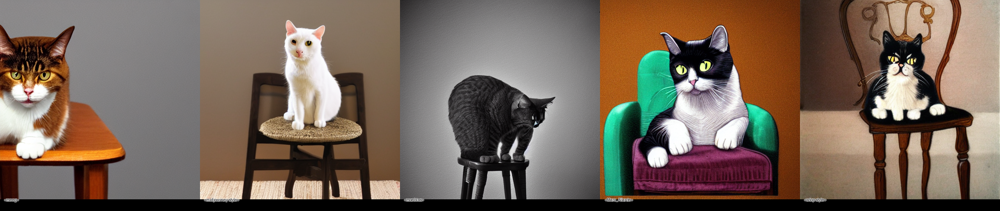

In [10]:
prompt = 'Cat on a chair in the style of' #@param
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50  #@param           # Number of denoising steps
guidance_scale = 8 #@param               # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1
vignette_loss_scale = 0 #@param

latents_collect = []
for seed_no,sd in zip(seed_list, tokens):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    prompts = [f'{prompt}, {sd}']

    latents = generate_latents_sd(seed_no, prompt, vignette_loss_scale)
    latents_collect.append(latents)

# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, 5, tokens)

### With Custom Loss

<ipython-input-8-7aa803aba0af>:31: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 3.200784206390381
10 loss: 3.3735556602478027
20 loss: 3.0357987880706787
30 loss: 2.9708197116851807
40 loss: 2.9739832878112793


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 3.826810836791992
10 loss: 3.3220677375793457
20 loss: 3.092164993286133
30 loss: 3.1063358783721924
40 loss: 3.139291286468506


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 3.491819381713867
10 loss: 2.6912710666656494
20 loss: 2.8945538997650146
30 loss: 2.7897002696990967
40 loss: 2.862393617630005


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 2.749556303024292
10 loss: 1.717885971069336
20 loss: 1.8307139873504639
30 loss: 1.8830654621124268
40 loss: 1.9453198909759521


  0%|          | 0/50 [00:00<?, ?it/s]

0 loss: 3.690821647644043
10 loss: 2.9340431690216064
20 loss: 2.6309802532196045
30 loss: 2.608394145965576
40 loss: 2.64794921875


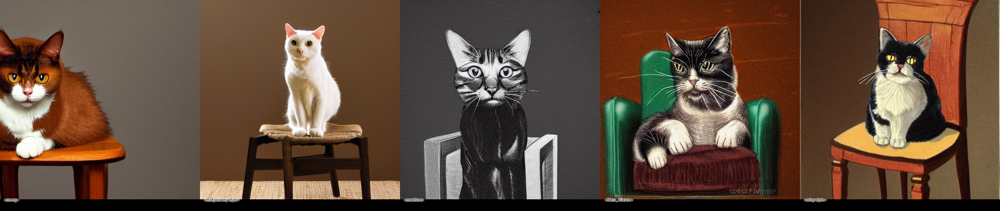

In [12]:
prompt = 'Cat on a chair in the style of' #@param
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 50  #@param           # Number of denoising steps
guidance_scale = 8 #@param               # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1
vignette_loss_scale = 30 #@param

latents_collect = []
for seed_no,sd in zip(seed_list, tokens):

    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    prompts = [f'{prompt}, {sd}']

    latents = generate_latents_sd(seed_no, prompt, vignette_loss_scale)
    latents_collect.append(latents)

# show all
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, 5, tokens)

In [13]:
# Clear cache
torch.cuda.empty_cache()
gc.collect()

44

---

---

## Concept Embeddings using CLIP

Here, instead of loading the concepts from SD concept library, concept embeddings are created using CLIP

In [14]:
def get_concept_embedding(concept_text):
    """
    Generate CLIP embedding for a concept described in text

    :param concept_text (str): Text description of the concept (e.g., "sketch painting")
    :return: torch.Tensor: CLIP embedding for the concept
    """
    # Tokenize the concept text
    concept_tokens = tokenizer(
        concept_text,
        padding="max_length",
        max_length=tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt"
    ).input_ids.to(torch_device)

    # Generate the embedding using the text encoder
    with torch.no_grad():
        concept_embedding = text_encoder(concept_tokens)[0]

    return concept_embedding

## Generate Latents

In [15]:
def generate_latents(seed_number, prompt, concept_embedding=None, concept_strength=0.3):
    """
    Function to generate latents from the UNet
    :param seed_number: Seed
    :param prompt: Text prompt
    :param concept_embedding: CLIP embedding to influence generation (optional)
    :param concept_strength: How strongly to apply the concept (0.0-1.0)
    :return: Latents of the UNet. This will be passed to the VAE to generate the image
    """
    # Set the seed
    generator = torch.manual_seed(seed_number)

    # Prep text
    text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
    with torch.no_grad():
        text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

    # Apply concept embedding influence if provided
    if concept_embedding is not None and concept_strength > 0:
        # Fix the dimension mismatch by adding a batch dimension to concept_embedding if needed
        if len(concept_embedding.shape) == 2 and len(text_embeddings.shape) == 3:
            # Add batch dimension to concept_embedding to match text_embeddings
            concept_embedding = concept_embedding.unsqueeze(0)

        # Create weighted blend between original text embedding and concept
        if text_embeddings.shape == concept_embedding.shape:
            # Interpolate between text embeddings and concept
            text_embeddings = (1 - concept_strength) * text_embeddings + concept_strength * concept_embedding
            print(f"Successfully applied concept with strength {concept_strength}")
        else:
            print(f"Warning: Shapes still incompatible after adjustment. Concept: {concept_embedding.shape}, Text: {text_embeddings.shape}")

    # And the uncond. input as before:
    max_length = text_input.input_ids.shape[-1]
    uncond_input = tokenizer(
        [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
    )
    with torch.no_grad():
        uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
    text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

    # Prep Scheduler
    set_timesteps(scheduler, num_inference_steps)

    # Prep latents
    latents = torch.randn(
    (batch_size, unet.in_channels, height // 8, width // 8),
    generator=generator,
    )
    latents = latents.to(torch_device)
    latents = latents * scheduler.init_noise_sigma

    # Loop
    for i, t in tqdm(enumerate(scheduler.timesteps), total=len(scheduler.timesteps)):
        # expand the latents if we are doing classifier-free guidance to avoid doing two forward passes.
        latent_model_input = torch.cat([latents] * 2)
        sigma = scheduler.sigmas[i]
        latent_model_input = scheduler.scale_model_input(latent_model_input, t)

        # predict the noise residual
        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings)["sample"]

        # perform CFG
        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        #### ADDITIONAL GUIDANCE ###
        if i%5 == 0:
            # Requires grad on the latents
            latents = latents.detach().requires_grad_()

            # Get the predicted x0:
            latents_x0 = latents - sigma * noise_pred
            # latents_x0 = scheduler.step(noise_pred, t, latents).pred_original_sample

            # Decode to image space
            denoised_images = vae.decode((1 / 0.18215) * latents_x0).sample / 2 + 0.5 # range (0, 1)

            # Calculate loss
            loss = vignette_loss(denoised_images) * vignette_loss_scale

            # Occasionally print it out
            if i%10==0:
                print(i, 'loss:', loss.item())

            # Get gradient
            cond_grad = torch.autograd.grad(loss, latents)[0]

            # Modify the latents based on this gradient
            latents = latents.detach() - cond_grad * sigma**2

        # Now step with scheduler
        latents = scheduler.step(noise_pred, t, latents).prev_sample
    return latents

## Display Generated Images

### Without Custom Loss

Generating image with concept 'sketch_painting' at strength 0.5
Successfully applied concept with strength 0.5


<ipython-input-15-91d6dbec56f9>:47: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0
Generating image with concept 'oil_painting' at strength 0.5
Successfully applied concept with strength 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0
Generating image with concept 'watercolor' at strength 0.5
Successfully applied concept with strength 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0
Generating image with concept 'digital_art' at strength 0.5
Successfully applied concept with strength 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0
Generating image with concept 'comic_book' at strength 0.5
Successfully applied concept with strength 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 0.0
10 loss: 0.0
20 loss: 0.0


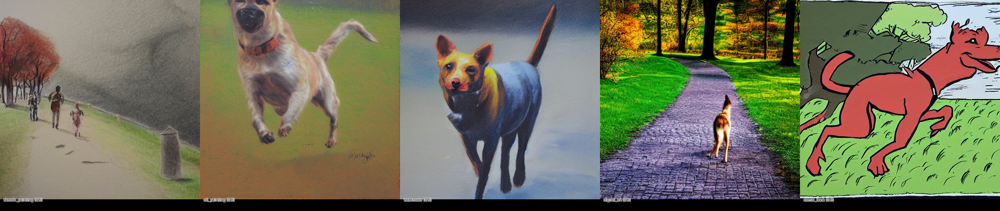

In [16]:
prompt = 'Dog running in the park'  #@param
concept_strength = 0.5              #@param # How strongly to apply the concept (0.0-1.0)
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 30            #@param # Number of denoising steps
guidance_scale = 8                  #@param # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1
vignette_loss_scale = 0           #@param

# Generate concept embeddings for different art styles
art_concepts = {
    "sketch_painting": get_concept_embedding("a sketch painting, pencil drawing, hand-drawn illustration"),
    "oil_painting": get_concept_embedding("an oil painting, textured canvas, painterly technique"),
    "watercolor": get_concept_embedding("a watercolor painting, fluid, soft edges"),
    "digital_art": get_concept_embedding("digital art, computer generated, precise details"),
    "comic_book": get_concept_embedding("comic book style, ink outlines, cel shading")
}

# Example usage in your main code:
latents_collect = []
concept_labels = []

seed_list = [2000,1000,500,600,100]

for seed_no, concept in zip(seed_list, art_concepts.keys()):
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    print(f"Generating image with concept '{concept}' at strength {concept_strength}")

    # Get the concept embedding
    concept_embedding = art_concepts[concept]

    # Generate latents using the concept embedding
    latents = generate_latents(seed_no, prompt, concept_embedding, concept_strength)
    latents_collect.append(latents)
    concept_labels.append(f"{concept} ({concept_strength})")

# Show results
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(seed_list), concept_labels)

### With Custom Loss

Generating image with concept 'sketch_painting' at strength 0.5
Successfully applied concept with strength 0.5


<ipython-input-15-91d6dbec56f9>:47: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  (batch_size, unet.in_channels, height // 8, width // 8),


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 10.109996795654297
10 loss: 2.5396955013275146
20 loss: 2.6179864406585693
Generating image with concept 'oil_painting' at strength 0.5
Successfully applied concept with strength 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 6.3510308265686035
10 loss: 4.054958343505859
20 loss: 3.848308563232422
Generating image with concept 'watercolor' at strength 0.5
Successfully applied concept with strength 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 15.120929718017578
10 loss: 2.1479904651641846
20 loss: 1.8862965106964111
Generating image with concept 'digital_art' at strength 0.5
Successfully applied concept with strength 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 4.434938430786133
10 loss: 2.618824005126953
20 loss: 2.6186304092407227
Generating image with concept 'comic_book' at strength 0.5
Successfully applied concept with strength 0.5


  0%|          | 0/30 [00:00<?, ?it/s]

0 loss: 11.334806442260742
10 loss: 2.076017379760742
20 loss: 1.983959674835205


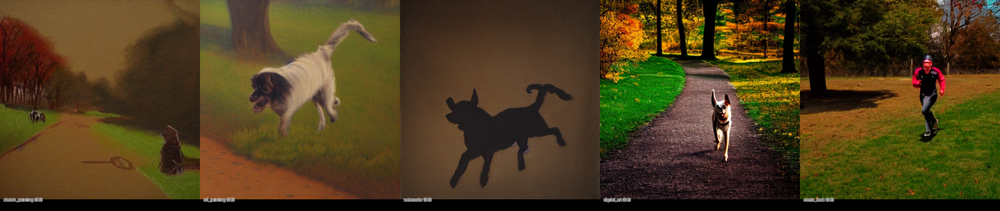

In [17]:
prompt = 'Dog running in the park'  #@param
concept_strength = 0.5              #@param # How strongly to apply the concept (0.0-1.0)
height = 512                        # default height of Stable Diffusion
width = 512                         # default width of Stable Diffusion
num_inference_steps = 30            #@param # Number of denoising steps
guidance_scale = 8                  #@param # Scale for classifier-free guidance
generator = torch.manual_seed(32)   # Seed generator to create the inital latent noise
batch_size = 1
vignette_loss_scale = 70           #@param

# Generate concept embeddings for different art styles
art_concepts = {
    "sketch_painting": get_concept_embedding("a sketch painting, pencil drawing, hand-drawn illustration"),
    "oil_painting": get_concept_embedding("an oil painting, textured canvas, painterly technique"),
    "watercolor": get_concept_embedding("a watercolor painting, fluid, soft edges"),
    "digital_art": get_concept_embedding("digital art, computer generated, precise details"),
    "comic_book": get_concept_embedding("comic book style, ink outlines, cel shading")
}

# Example usage in your main code:
latents_collect = []
concept_labels = []

seed_list = [2000,1000,500,600,100]

for seed_no, concept in zip(seed_list, art_concepts.keys()):
    # Clear the CUDA cache
    torch.cuda.empty_cache()
    gc.collect()
    torch.cuda.empty_cache()

    print(f"Generating image with concept '{concept}' at strength {concept_strength}")

    # Get the concept embedding
    concept_embedding = art_concepts[concept]

    # Generate latents using the concept embedding
    latents = generate_latents(seed_no, prompt, concept_embedding, concept_strength)
    latents_collect.append(latents)
    concept_labels.append(f"{concept} ({concept_strength})")

# Show results
latents_collect = torch.vstack(latents_collect)
images = latents_to_pil(latents_collect)
image_grid(images, 1, len(seed_list), concept_labels)